## Baselines for comparison

### Non-local Means

In [8]:
import sys
from skimage.util import random_noise 
from skimage.data import camera 
from skimage import img_as_float

from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage.metrics import peak_signal_noise_ratio , structural_similarity
from skimage.util import random_noise

from pyortho import localsimi

import matplotlib.pyplot as plt


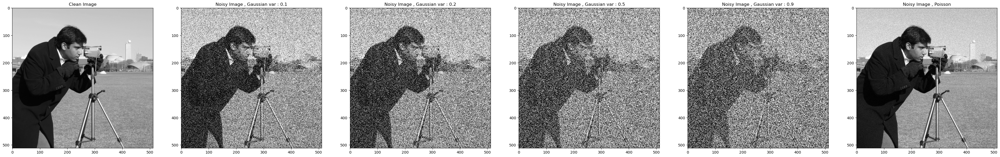

In [9]:
images = []
images.append(img_as_float(camera()))

noise_factors = [0.1, 0.2, 0.5, 0.9]

images.extend(list(map(lambda x : random_noise(images[0], 'gaussian', mean=0, seed=42, clip=True, var=x), noise_factors)))

images.append(random_noise(images[0], 'poisson', seed=42))

fig,ax = plt.subplots(ncols=len(images), figsize=(8*len(images),8))

for i in range(len(images)) : 
  ax[i].imshow(images[i], cmap='gray')
  # ax.axes('off')
  if i == 0 : 
    ax[i].set_title('Clean Image')
  elif i <= len(noise_factors) : 
    ax[i].set_title(f"Noisy Image , Gaussian var : {noise_factors[i-1]}")
  else : 
    ax[i].set_title(f"Noisy Image , Poisson")
plt.show()

In [21]:
denoised = []
noisy = []

noise_factors = [0, 0.1, 0.2, 0.5, 0.9]

bigWindowSize = 8 
smallWindowSize = 4

%timeit
for noise_factor in noise_factors : 
    clean = images[0]
    noisy_ = random_noise(clean, 'gaussian', mean = 0 , seed=42, var= noise_factor, clip=True)
    
    noisy.append(noisy_)
    print(f"Noise factor {noise_factor}")
    print(f"Estimated noise standard deviation : {estimate_sigma(noisy_)}")
    
    denoised_ = denoise_nl_means(noisy_, fast_mode=False,h=1.15 * noise_factor ** 0.5, sigma = estimate_sigma(noisy_),patch_size=5,      # 5x5 patches
                patch_distance=6)  # 13x13 search area
    
    denoised.append(denoised_)

Noise factor 0
Estimated noise standard deviation : 0.004937812963672334


/Users/jayanthboddu/miniforge3/envs/lightning-mps/lib/python3.8/site-packages/skimage/restoration/non_local_means.py:182: RuntimeWarning: divide by zero encountered in double_scalars
  dn = np.asarray(nlm_func(image, **kwargs))


Noise factor 0.1
Estimated noise standard deviation : 0.24556709212879985
Noise factor 0.2
Estimated noise standard deviation : 0.31151984199737537
Noise factor 0.5
Estimated noise standard deviation : 0.3941870428944253
Noise factor 0.9
Estimated noise standard deviation : 0.43649832394231386


In [22]:
# Comparing PSNR, SSIM, MS-SSIM, LS
from skimage.metrics import peak_signal_noise_ratio , structural_similarity 
psnrs_noisy = []
psnrs_denoised = []
ssims_noisy = []
ssims_denoised = []
mses_noisy = []
mses_denoised = []

for i in range(len(noise_factors)-1) : 
  clean = images[0]
  psnrs_noisy.append(peak_signal_noise_ratio(clean, noisy[i+1]))
  psnrs_denoised.append(peak_signal_noise_ratio(clean,denoised[i+1]))
  ssims_noisy.append(structural_similarity(noisy[i+1], clean))
  ssims_denoised.append(structural_similarity(denoised[i+1], clean))

In [23]:
psnrs_noisy, psnrs_denoised, ssims_noisy, ssims_denoised

([11.81162549042972, 9.758079951912048, 7.788945031239194, 6.937753412879978],
 [21.487882187149143,
  18.859825522626934,
  15.89595126365576,
  14.49346346120164],
 [0.12004989166086526,
  0.0781520600976749,
  0.046840557363216545,
  0.03537744257175978],
 [0.6740974591330082,
  0.6233255806726367,
  0.5923387720036456,
  0.5727828044945856])

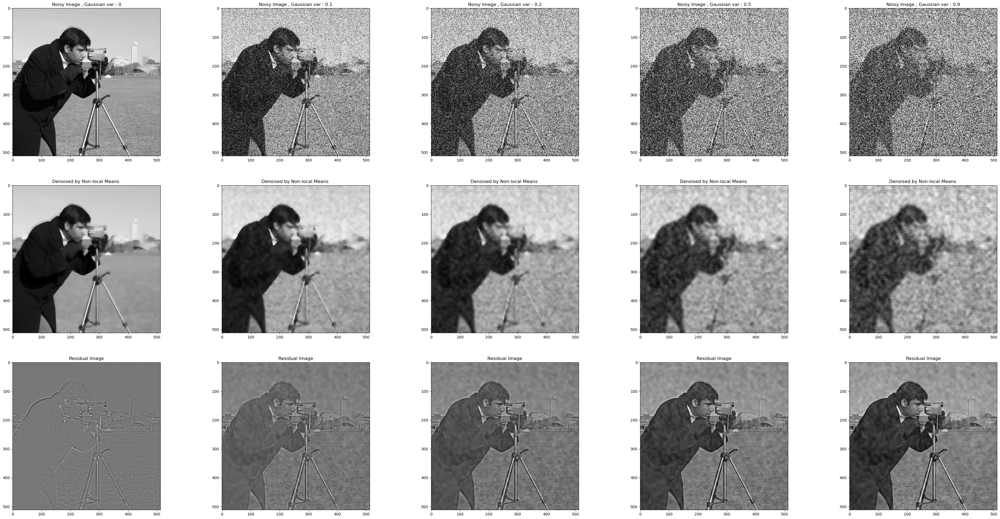

In [25]:
fig,ax = plt.subplots(ncols=len(denoised), nrows=3, figsize=(8*len(images),8 * 3))

for i in range(len(denoised)) : 
  clean = images[0]
  ax[0,i].imshow(noisy[i], cmap='gray')
  ax[0,i].set_title(f"Noisy Image , Gaussian var : {noise_factors[i]}")
  ax[1,i].imshow(denoised[i], cmap='gray')
  ax[1,i].set_title(f"Denoised by Non-local Means ")
  ax[2,i].imshow(clean - denoised[i], cmap='gray')
  ax[2,i].set_title(f"Residual Image")

plt.show()

In [26]:
0.9 ** 0.5

0.9486832980505138